# **Dog classification**

**Student:** Emilija Ljubisavljević IT33/2019<br>
**Predmet:** Principi prezentacije i prepoznavanja oblika <br>


## **Sadržaj**


1.   Uvod
2.   Klasifikacija
3.   Klasifikacija slika
4.   Zaključak
5.   Reference

## **Uvod**

Cilj izrade ovog rada jeste istražiti i videti primenu tehnika mašinskog učenja, kao i dubokog učenja za rešavanje problema obrade fotografije.
U nastavku rada obrađena je tema projekta - klasifikacija rasa pasa, pri čemu je kreiran model koji na osnovu date slike prepozna koje je rase pas.  

*Dataset* sadrži slike pasa raspoređenih u dva foldera - folder "train" i folder "test", kao i dva .csv fajla, "labels.csv" i "sample_submissions.csv". U prvom se nalaze definisane slike(id) i naziv rase pasa(breed), a u drugom  se nalazi kraljni izlaz u odgovarajućem formatu.
Folder "train" sadrži 10,222 slike, a folder "test" sadrži 10,357 slika.


Link do *dataset*-a je: https://drive.google.com/file/d/1QlvYtrDX_PHgxMUIrdJRO5kcnCqxurmO/view?usp=sharing

#**Klasifikacija**
Klasifikacija je zadatak nadgledanog mašinskog učenja čiji je cilj predvideti klasne oznake novih instanci na osnovu ranijih opažanja. Tačnije, obučavamo model koristeći trening podatake i tako obučen model koristimo za predviđanje novih, do tada neviđenih podataka. Termin „nadgledano učenje“ odnosi se na skup trening primera - ulaznih podataka, gde su signali željenog izlaza - oznake već poznati.

Primer klasifikacije sa kojim se susrećemo u svakodnevnom životu jeste sistem elektronske pošte koji ima mogućnost automatskog otkrivanja neželjenih poruka. To znači da sistem analizira sve dolazne poruke i označava ih kao spam ili ne-spam, tako da čak i mi, kao krajnji korisnici, imamo mogućnost da ručno označimo poruke kao neželjene, kako bismo poboljšali sposobnost otkrivanja spam-a.

Ovaj primer klasifikacije spada u *binarnu klasifikaciju* jer postoje samo dve klase 'spam' i 'no-spam'.

Postoje još tri vrste klasifikacije:

1.*Multi-Class* kada postoje više od dve klase,

2.*Multi-Label* kada jedan objekat pripada jednoj ili više klasa i

3.*Unbalanced* kada je broj primera u svakoj klasi nejednako raspoređen.

# **Klasifikacija slika**


Klasifikacija slika predstavlja dodjeljivanje najverovatnije kategorije kojoj pripada fotogafija iz nekog skupa fiksnih kategorija.

Postoje dva tipa klasifikatora slika:

1.Klasifikacija pomoću karakteristika koje su uočene na fotografijama,

2.Kada se duboka neuronska mreža obučava za klasifikovanje fotografija.

Klasifikacija slika sastoji se od dve faze:

1.*Faza treniranja* - algoritmu za klasifikaciju se pružaju ulazi za koje je poznata oznaka klase i koristeći te ulaze obučava se model

2.*Faza testiranja* - nakon završenog treninga, naučeni model se koristi za predviđanje klasa novih, do tada neviđenih ulaza

Postoji mnogo arhitektura za klasifikaciju slika, a jedna od najpopularnijih su konvolucione neuronske mreže - *CNN*. *CNN* su posebno efikasni u klasifikaciji slika jer su u stanju da automatski nauče prostornu hijerarhiju karakteristika, kao što su ivice, teksture i oblici, koji su važni za prepoznavanje objekata na slikama.


Kao što je navedeno u uvodu, cilj izrade ovog rada je da se za slike pasa predvidi kojoj rasi oni pripadaju. Primenom *Transfer Learning-a*, odnosno korišćenjem već unapred istreniranih neuronskih mreža na koje se dodaje poslednji sloj.

U ovom projektu za proces klasifikacija slika korišćena je *MobileNetV2* konvoluciona neuronska mreža. *MobileNetV2* se odlikuje nizom tehnika koje doprinose smanjenju broja parametara i računarskih resursa, ali i održavanju visoke tačnosti. *MobileNetV2* arhitektura je zasnovana na invertiranoj rezidualnoj strukturi gde su ulaz i izlaz rezidualnog bloka tanki slojevi uskog grla suprotni tradicionalnim rezidualnim modelima koji koriste proširene reprezentacije na ulazu, dok *MobileNetV2* koristi lagane konvolucije po dubini da filtrira karakteristike u srednjem sloju proširenja. Umesto da se direktno smanje broj kanala nakon proširivanja, *MobileNetV2* koristi linearno proširenje kanala, gde se broj kanala linearno povećava pre primene konvolucije. Ova tehnika je korišćena jer pored toga što omogućava da se mreža bolje prilagodi i detektuje složenije obrasce, postiže jako dobru ravnotežu između performansi i resursa.



Izrada projekta je započeta tako što je prvo instaliran paket Python paket *gdown*, koji omogućava preuzimanje datoteka sa datog Google Drive-a u okviru specifikacije projekta.

In [ ]:
!pip install gdown

Nakon preuzimanja, potrebno je importovati *gdown* paket, kako bi se preuzeo zipovan dataset koji sadrži podatke za klasifikaciju pasa. Podešava se adresa sa koje se preuzima zipovani dataset, kao i putanja i datoteka gde će se on sačuvati.

In [ ]:
import gdown

url = 'https://drive.google.com/uc?id=1QlvYtrDX_PHgxMUIrdJRO5kcnCqxurmO'
output = '/content/datasetdogclass.zip'

gdown.download(url, output, quiet=False)

Downloading...
From: https://drive.google.com/uc?id=1QlvYtrDX_PHgxMUIrdJRO5kcnCqxurmO
To: /content/datasetdogclass.zip
100%|██████████| 724M/724M [00:11<00:00, 60.4MB/s]


'/content/datasetdogclass.zip'

Raspakovanje preuzetog dataset-a na datu putanju.

In [ ]:
!unzip /content/datasetdogclass.zip -d /content/datasetdogclass

Streaming output truncated to the last 5000 lines.
  inflating: /content/datasetdogclass/train/83bc62b0fffa99a9c94ba0b67a5f7395.jpg  
  inflating: /content/datasetdogclass/train/83bcff6b55ee179a7c123fa6103c377a.jpg  
  inflating: /content/datasetdogclass/train/83be6d622ab74a5e7e08b53eb8fd566a.jpg  
  inflating: /content/datasetdogclass/train/83c2d7419b0429b9fe953bc1b6cddbec.jpg  
  inflating: /content/datasetdogclass/train/83cf7d7cd2a759a93e2ffd95bea9c6fb.jpg  
  inflating: /content/datasetdogclass/train/83d405858f0931722ef21e8ac0adee4d.jpg  
  inflating: /content/datasetdogclass/train/83d4125a4c3c7dc5956563276cb1cd74.jpg  
  inflating: /content/datasetdogclass/train/83f0bb565b2186dbcc6a9d009cb26ff2.jpg  
  inflating: /content/datasetdogclass/train/83fad0718581a696132c96c166472627.jpg  
  inflating: /content/datasetdogclass/train/83fbbcc9a612e3f712b1ba199da61f20.jpg  
  inflating: /content/datasetdogclass/train/8403d8936430c2f05ab7d74d23c2c0cb.jpg  
  inflating: /content/datasetdogclas

Importovanje biblioteka za mašinsko učenje - *TensorFlow* i *TensorFlow Hub* i ispis korišćenih verzija.

*TensorFlow* biblioteka pruža različite funkcionalnosti za mašinsko učenje i duboko učenje. TensorFlow API se koristi za izgradnju, treniranje i evaluaciju modela. TensorFlow je postao jedan od najpopularnijih alata za izgradnju i treniranje neuronskih mreža.

*TensorFlow Hub* biblioteka pruža prethodno obučene modele, tzv. modulima, koji se mogu koristiti za različite zadatke u mašinskom učenju. Olakšava korišćenje prethodno obučenih modela kao slojeva u ovom modelu.

In [ ]:
import tensorflow as tf
import tensorflow_hub as hub
tf.__version__, hub.__version__


('2.12.0', '0.13.0')

Importovanje biblioteke *pandas* koja se koristi za manipulaciju i analizu podataka. Omogućava isčitavanje podataka iz csv datoteke - *labels.csv*. CSV datoteka sadrži informacije o oznakama pasa za klasifikaciju - nazivi rasa pasa i njihove identifikcione oznake. Prikazuje se statistički pregled podataka (broj podataka, srednje vrednosti..) i prvih nekoliko redova podataka.



In [ ]:
import pandas as pd
labels_csv = pd.read_csv("/content/datasetdogclass/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


Zatim sledi prikaz isčitavanja prvih pet redova podataka u tabelarnom formatu nakon preuzimanja iz label.csv fajla.

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


Grafički prikaz - *bar plot* koji prikazuje brojnost svake rase pasa u koloni "breed".


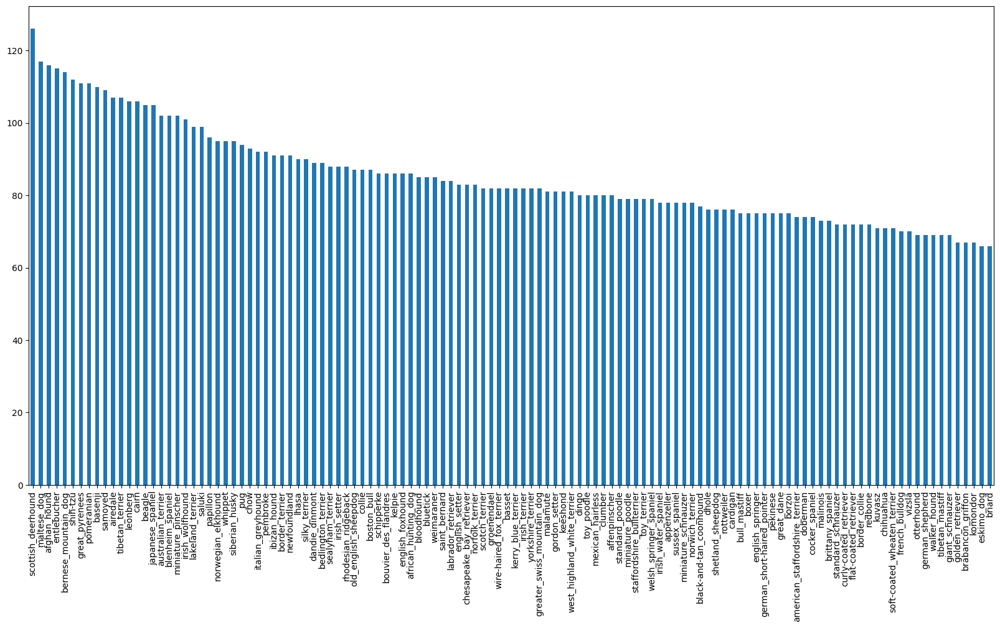

In [ ]:
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10));

Importovanje alata za manipulaciju slika i provera da li je sve importovano
kako treba.
Importovanje funkcije *display* i *Image* iz *IPython.display* modula, alata za manipulaciju slika. Ove funkcije se koriste za prikazivanje slika. Zatim se proverava uspešnost prikazivanja slike.


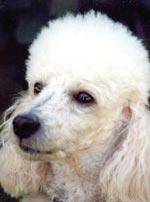

In [ ]:
from IPython.display import display, Image
Image("/content/datasetdogclass/train/0f7c32eb17dce55860772c983f557e3c.jpg")

Generisanje liste *filenames* koja sadrži putanje do slika pasa na osnovu identifikatora iz kolone "id" iz labels_csv. Listu se koristi za dalju obradu ili prikazivanje slika.

In [ ]:
filenames = ["/content/datasetdogclass/train/" + fname + ".jpg" for fname in labels_csv["id"]]

Provera tačnosti generisanih putanja i ispis prvih 10 elemenata liste *filenames*.

In [ ]:
filenames[:10]

['/content/datasetdogclass/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/datasetdogclass/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/datasetdogclass/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/datasetdogclass/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/datasetdogclass/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/datasetdogclass/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/datasetdogclass/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/datasetdogclass/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/datasetdogclass/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/datasetdogclass/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

Proverava se da li je broj slika u folderu za trening odgovara broju elemenata u listi filenames, odnosno da li su podaci isti.

In [ ]:
import os
len(os.listdir("/content/datasetdogclass/train/"))==len(filenames)

True

Prikaz slike na putanji filenames[6000] koja predstavlja određenu sliku psa iz *dataset-a*.

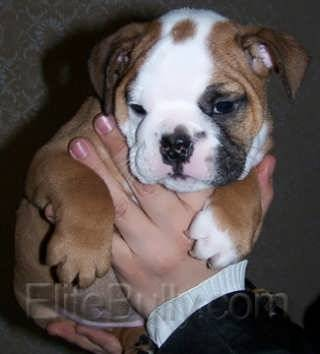

In [ ]:
Image(filenames[6000])

Vraća se vrednost naziva rase psa za sliku sa indeksom 6000.

In [ ]:
labels_csv["breed"][6000]

'french_bulldog'

Koristi se funkcija *to_numpy()* iz biblioteke *pandas* kako bi se konvertovala kolona "breed" iz labels_csv u numpy niz, tačnije kreira se poseban niz koji sadrži samo nazive rasa pasa.



In [ ]:
import numpy as np
labels = labels_csv["breed"].to_numpy()
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

Zatim se vraća broj elemenata u nizu *labels*, tačnije broj instanci rasnih oznaka u *dataset-u*.

In [ ]:
len(labels)


10222

Proverava se da li je tačno isti broj rasnih oznaka i broj generisanih putanja do slika pasa u *dataset-u*.

In [ ]:
len(labels)==len(filenames)

True

Raznolikost rasa pasa u *dataset-u*

Korišćenje funkcije *np.unique()* iz biblioteke *NumPy* kako bi se izdvojile jedinstvene vrednosti iz niza labels i vratio broj jedinstvenih rasa pasa.

In [ ]:
unique_breeds = np.unique(labels)
len(unique_breeds)

120

Provera pojavljivanja jedinstvenih vrsta u nizu - proverava se da li prva vrednost u nizu *labels* odgovara nekom od jedinstvenih vrednosti u nizu *unique_breeds*.

In [ ]:
labels[0] == unique_breeds

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

Kreiranje boolean niza u kojem se čuvaju podaci o pojavi različitih vrsta pasa unutar niza. Provera da li svaka vrednost u nizu *labels* odgovara nekoj od jedinstvenih vrednosti u nizu *unique_breeds*.

In [ ]:
boolean_labels = [label == unique_breeds for label in labels ]

Prikaz prve dve boolean vrednosti iz liste *boolean_labels*.

In [ ]:
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

Prikaz prethodnih koraka - različite informacije o prvoj vrednosti u nizu *labels* i povezane jedinstvene vrednosti u *unique_breeds*, indeks elementa sa maksimalnom vrednošću u *boolean_labels*, kao i konvertovani niz sa celobrojnim vrednostima iz *boolean_labels[0]*.

In [ ]:
print(labels[0])
print(np.where(unique_breeds == labels[0])[0][0])
print(boolean_labels[0].argmax())
print(boolean_labels[0].astype(int))

boston_bull
19
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


Prikaz prethodnih koraka - informacije o trećoj vrednosti u nizu *labels* i povezana boolean oznaka u *boolean_labels[2]*.



In [ ]:
print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


Kreirani nizovi se smeštaju u promenjive X i y.

In [ ]:
X = filenames
y = boolean_labels

Zatim se vraća broj elemenata u listi *filenames*, što predstavlja ukupan broj slika pasa.

In [ ]:
len(filenames)

10222

Ograničenje broja slika za trening.

In [ ]:
number_of_images = 1000

Koristi se funkcija train_test_split iz biblioteke *sklearn.model_selection* da bi se podelili podatke na trening i validacioni skup.

In [ ]:
from sklearn.model_selection import train_test_split
train_x, valid_x, train_y, valid_y = train_test_split(X[:number_of_images],
                                                      y[:number_of_images],
                                                      test_size=0.2,
                                                      random_state=42)
len(train_x), len(valid_x), len(train_y), len(valid_y)

(800, 200, 800, 200)

Provera tačnosti podeljenih skupova - train_x[:5] će prikazati prvih pet elemenata trening skupa putanja do slika, dok će train_y[:5] prikazati prvih pet elemenata trening skupa boolean oznaka.

In [ ]:
train_x[:5], train_y[:5]

(['/content/datasetdogclass/train/00bee065dcec471f26394855c5c2f3de.jpg',
  '/content/datasetdogclass/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  '/content/datasetdogclass/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  '/content/datasetdogclass/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  '/content/datasetdogclass/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, 

Importovanje i korišćenje funkcije *imread* iz biblioteke *matplotlib.pyplot* za čitanje slike sa određene putanje filenames[34] i vraća dimenzije slike i njen format (visina, širina, broj kanala).

In [ ]:
from matplotlib.pyplot import imread
image = imread(filenames[34])
image.shape

(407, 594, 3)

Vraća se putanja do slike na indeksu 56 u listi *filenames*.

In [ ]:
filenames[56]

'/content/datasetdogclass/train/0162107acd8f2588c0944b791d61bb0c.jpg'

Varijabla *image* dodeljena vrednosti slikovnog niza je reprezentacija slike u obliku trodimenzionalnog numpy niza - promenljiva koja sadrži informacije o pikselima slike i omogućava manipulaciju i analizu slike koristeći različite operacije i biblioteke.

In [ ]:
image

array([[[ 25,  26,  31],
        [ 24,  25,  30],
        [ 35,  36,  41],
        ...,
        [207, 200, 184],
        [205, 197, 184],
        [205, 197, 184]],

       [[ 41,  42,  47],
        [ 26,  27,  32],
        [ 38,  39,  44],
        ...,
        [207, 200, 184],
        [205, 197, 184],
        [205, 197, 184]],

       [[ 31,  32,  37],
        [ 21,  22,  27],
        [ 33,  34,  39],
        ...,
        [207, 200, 184],
        [206, 198, 185],
        [206, 198, 185]],

       ...,

       [[ 44,  45,  50],
        [ 52,  53,  58],
        [ 55,  56,  61],
        ...,
        [  5,   9,  21],
        [  9,  12,  21],
        [  9,  12,  21]],

       [[ 34,  35,  40],
        [ 42,  43,  48],
        [ 48,  49,  54],
        ...,
        [  7,  11,  23],
        [  9,  12,  21],
        [  9,  12,  21]],

       [[ 24,  25,  30],
        [ 28,  29,  34],
        [ 34,  35,  40],
        ...,
        [ 10,  14,  26],
        [  9,  12,  21],
        [  9,  12,  21]]

Konvertuje se slikovni niz *image* u *TensorFlow* konstantu, pri čemu prikazuje prva dva elementa. *TensorFlow* konstanta zadržava trodimenzionalnu strukturu slike, kao i originalne vrednosti piksela.

In [ ]:
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 594, 3), dtype=uint8, numpy=
array([[[ 25,  26,  31],
        [ 24,  25,  30],
        [ 35,  36,  41],
        ...,
        [207, 200, 184],
        [205, 197, 184],
        [205, 197, 184]],

       [[ 41,  42,  47],
        [ 26,  27,  32],
        [ 38,  39,  44],
        ...,
        [207, 200, 184],
        [205, 197, 184],
        [205, 197, 184]]], dtype=uint8)>

Definiše se funkcija *process_image* koja uzima putanju do slike kao ulazni argument i vrši obradu slike prema definisanim koracima koristeći *TensorFlow* funkcionalnosti - dekodiranje, promenu veličine i konvertovanje tipa slike kako bi one bile u što pogodnijem stanju za dalju obradu.

In [ ]:
image_size = 224

def process_image(image_path):
  image = tf.io.read_file(image_path)
  image = tf.image.decode_jpeg(image, channels=3)
  image = tf.image.convert_image_dtype(image, tf.float32)
  image = tf.image.resize(image, size=[image_size, image_size])
  return image

Definiše se funkcija *get_image_labels* koja prihvata sliku i vrstu psa, a onda sliku šalje na obradu pa je nazad vraća obrađenu zajedno sa vrstom.

In [ ]:
def get_image_labels(image_path, label):
  image = process_image(image_path)
  return image, label

Pristupanje obrađenoj slici i konstantnoj oznaci za određeni indeks u skupu podataka. Izraz koji koristi funkciju *process_image* za obradu slike sa putanje X[34] i konvertuje odgovarajuću oznaku y[34] u TensorFlow konstantu. Ovaj izraz vraća par koji se sastoji od obrađene slike i konstante oznake.

In [ ]:
(process_image(X[34]), tf.constant(y[34]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.09042301, 0.10218772, 0.12179556],
         [0.11473363, 0.12649834, 0.14610618],
         [0.09272581, 0.10449051, 0.12409835],
         ...,
         [0.8196079 , 0.79215693, 0.7294118 ],
         [0.8136382 , 0.78618723, 0.7234421 ],
         [0.80392164, 0.77647066, 0.7137255 ]],
 
        [[0.08168885, 0.09737512, 0.10913983],
         [0.09317887, 0.10886515, 0.12062985],
         [0.1127224 , 0.12840867, 0.14017338],
         ...,
         [0.8196079 , 0.79215693, 0.7294118 ],
         [0.8136382 , 0.78618723, 0.7234421 ],
         [0.80480576, 0.7773548 , 0.7146096 ]],
 
        [[0.1778584 , 0.19354467, 0.20530938],
         [0.10785257, 0.12353884, 0.13530354],
         [0.17694902, 0.1926353 , 0.2044    ],
         ...,
         [0.8196079 , 0.79215693, 0.7294118 ],
         [0.8136382 , 0.78618723, 0.7234421 ],
         [0.8078432 , 0.7803922 , 0.7176471 ]],
 
        ...,
 
        [[0.14830667, 0.16399294

Definisana je funkcija *create_batches* koja kreira pakete (batches) podataka za treniranje, validaciju ili testiranje, na osnovu ulaznih podataka X i y. Predstavlja kreiranje funkcije za kreiranje "serija" koje olakšavaju gore navedene procese. Podaci se konvertuju, menjaju im se dimenzije i vrši se mešanje podataka kako bi se kasnije lakše izvršili procesi treniranja, validacije ili testiranja.

In [ ]:
batch_size = 32

def create_batches(X, y=None, batch_size=batch_size, valid_data=False, test_data=False):
  if test_data:
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X)))
    data_batch = data.map(process_image).batch(batch_size)
    return data_batch
  elif valid_data:
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))
    data_batch = data.map(get_image_labels).batch(batch_size)
    return data_batch
  else:
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))

    data = data.shuffle(buffer_size=len(X))
    data = data.map(get_image_labels)
    data_batch = data.batch(batch_size)
    return data_batch


Kreiranje paketa podataka za trening i validaciju.

In [ ]:
train_data = create_batches(train_x, train_y)
valid_data = create_batches(valid_x, valid_y, valid_data=True)

Vraća informacije o elementima - o strukturi i tipovima podataka u skupovima podataka *train_data* i *valid_data*.


In [ ]:
train_data.element_spec, valid_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

Definisanje funkcije *show_20_images* koja prikazuje prvih 20 slika iz skupa podataka, zajedno sa odgovarajućim oznakama.

In [ ]:
import matplotlib.pyplot as plt
def show_20_images(images, labels):
  plt.figure(figsize=(10,10))
  for i in range(20):
    ax = plt.subplot(5,5,i+1)
    plt.imshow(images[i])
    plt.title(unique_breeds[labels[i].argmax()])
    plt.axis("off")

Promenljiva *train_data* predstavlja *TensorFlow Dataset* koja sadrži pakete podataka za trening. Ona je rezultat poziva funkcije *create_batches* sa trening podacima train_x i train_y.

*TensorFlow Dataset* je poseban tip podataka koji se koristi za efikasno rukovanje sa velikim skupovima podataka tokom obučavanja modela mašinskog učenja.

In [ ]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

Konverzija podataka u NumPy nizove, pri čemu će *train_images* sadržati obrađene slike, dok će *train_labels* sadržati odgovarajuće oznake.

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())
train_images, train_labels

(array([[[[3.91885310e-01, 3.91885310e-01, 3.60512733e-01],
          [4.37755316e-01, 4.37755316e-01, 4.06382769e-01],
          [4.43510175e-01, 4.43510175e-01, 4.12137628e-01],
          ...,
          [5.79666160e-02, 2.23976374e-02, 1.93765294e-02],
          [5.25209457e-02, 4.70588952e-02, 4.97899204e-02],
          [4.58683521e-02, 5.37114888e-02, 4.97899204e-02]],
 
         [[3.86534333e-01, 3.82612765e-01, 3.63004893e-01],
          [4.16156888e-01, 4.12235320e-01, 3.92627478e-01],
          [4.33154821e-01, 4.29233253e-01, 4.09625411e-01],
          ...,
          [9.09923986e-02, 5.17767183e-02, 4.75400351e-02],
          [3.03570777e-02, 2.48950310e-02, 2.76260544e-02],
          [2.37044860e-02, 3.15476246e-02, 2.76260544e-02]],
 
         [[3.68598878e-01, 3.64677310e-01, 3.45069438e-01],
          [3.54222625e-01, 3.50301057e-01, 3.30693215e-01],
          [3.98993552e-01, 3.95071983e-01, 3.75464112e-01],
          ...,
          [2.36178100e-01, 2.02337056e-01, 1.9541

Vraća se naziv rase psa na osnovu indeksa sa najvećom vrednošću u vektoru oznaka y[0].

In [ ]:
unique_breeds[y[0].argmax()]

'boston_bull'

Prikaz 20 slika na osnovu istreniranih slika i vrsta.

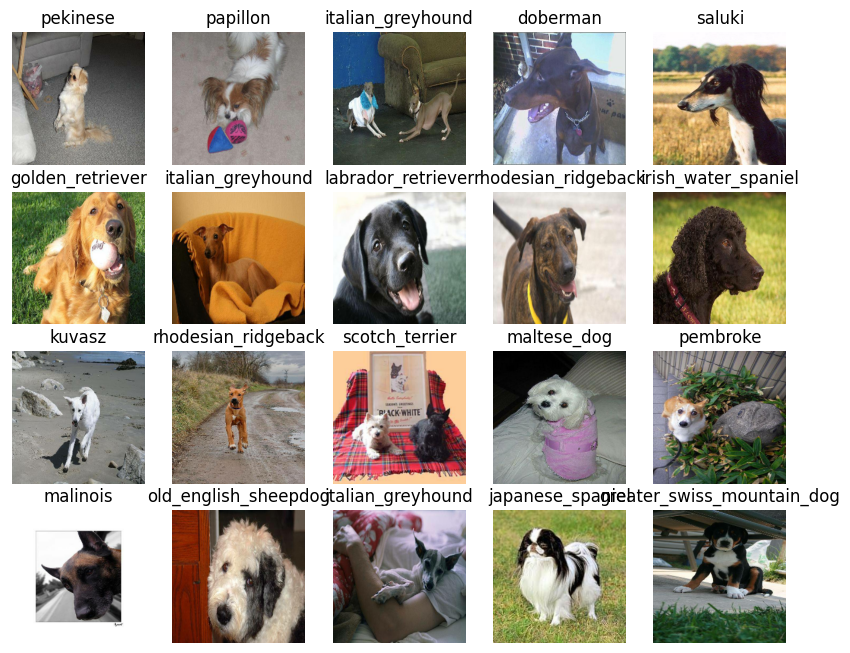

In [ ]:
show_20_images(train_images, train_labels)

Priprema parametara za kreiranje modela. Ove promenljive definišu karakteristike ulaznog oblika, izlaznog oblika i URL adrese modela koji će biti korišćeni u daljem procesu izgradnje modela i obučavanja -  *MobileNet v2* sa odgovarajućim konfiguracijama, tj. link za učitavanje modela *MobileNet v2* iz *TensorFlow Hub-a*.

In [ ]:
input_shape = [None, image_size, image_size, 3]
output_shape = len(unique_breeds)
Model_url = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

Kreira se funkcija *create_model* koja se koristi za kreiranje modela za klasifikaciju slika na osnovu zadatih ulaznih parametara, koristeći preneseno učenje odnosno *transfer learning*. Koristi se unapred obučen model (sa prethodno uvedenog linka) za izdvajanje karakteristika iz ulaznih slika i dodaje se "debeli" sloj na vrh radi klasifikacije. Model se onda kompajlira sa odgovarajućim podešavanjima gubitka, optimizatora i metrika.


In [ ]:
def create_model(input_shape=input_shape, output_shape=output_shape, model_url = Model_url):
  print("Building model with: ", model_url)

  model = tf.keras.Sequential([hub.KerasLayer(model_url),
                               tf.keras.layers.Dense(units = output_shape, activation="softmax")])
  model.compile(
      loss = tf.keras.losses.CategoricalCrossentropy(),
      optimizer = tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )
  model.build(input_shape)
  return model

Kreira se instanca modela za klasifikaciju slika na osnovu prethodno definisanih ulaznih parametara. Nakon toga se prikazuju karakteristike modela.

In [ ]:
model = create_model()
model.summary()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


Komanda koja omogućava učitavanje i korišćenje *TensorBoard* alata za vizualizaciju i analizu modela mašinskog učenja.

*TensorBoard* je alat koji dolazi uz *TensorFlow* biblioteku i omogućava interaktivno praćenje metrika, vizualizaciju grafova modela, analizu performansi.

In [ ]:
%load_ext tensorboard

Kreira se funkcija *tensorboard_callback* koja definiše povratni poziv (callback) za *TensorBoard* i koja prilikom treniranja modela beleži sve logove i prenosi ih do *TensorBoard-a* gde će se oni i prikazivati.

In [ ]:
import datetime

def tensorboard_callback():
  logdir = os.path.join("/content/datasetdogclass/logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

Definisanje povratnog poziva za "rani prekid" treniranja kada je model istreniran dovoljno odnosno kada se gubitak neće više menjati u narednim epohama.

In [ ]:
earlystop = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=3)

 Promenljiva koja definiše broj epoha, odnosno broj puta koliko će se model obučavati na celom skupu podataka.

In [ ]:
Num_epochs=50

Definisanje funkcije *train_model* koja se koristi za obučavanje modela koristeći definisane podatke za trening i validaciju, broj epoha, kao i povratne pozive za *TensorBoard* i rano zaustavljanje. Takođe, funkcija čuva obučeni model na disku i vraća taj model kao rezultat.

In [ ]:
def train_model():
  model = create_model()
  tensorboard = tensorboard_callback()
  model.fit(x = train_data,
            epochs=Num_epochs,
            validation_data=valid_data,
            validation_freq=1,
            callbacks=[tensorboard, earlystop])
  model.save('/content/datasetdogclass/model.h5')
  return model

Pokretanje treniranja modela sa zadatim podacima. Nakon obučavanja, istrenirani model će biti sačuvan na disku i dodeljen promenljivoj model.

In [ ]:
model = train_model()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/50
25/25 [==============================] - 41s 2s/step - loss: 4.6352 - accuracy: 0.0913 - val_loss: 3.4507 - val_accuracy: 0.2300
Epoch 2/50
25/25 [==============================] - 38s 2s/step - loss: 1.6614 - accuracy: 0.6787 - val_loss: 2.1856 - val_accuracy: 0.4800
Epoch 3/50
25/25 [==============================] - 40s 2s/step - loss: 0.5746 - accuracy: 0.9200 - val_loss: 1.6760 - val_accuracy: 0.5900
Epoch 4/50
25/25 [==============================] - 38s 2s/step - loss: 0.2591 - accuracy: 0.9825 - val_loss: 1.4831 - val_accuracy: 0.6450
Epoch 5/50
25/25 [==============================] - 47s 2s/step - loss: 0.1505 - accuracy: 0.9962 - val_loss: 1.3923 - val_accuracy: 0.6450
Epoch 6/50
25/25 [==============================] - 40s 2s/step - loss: 0.1029 - accuracy: 1.0000 - val_loss: 1.3640 - val_accuracy: 0.6450
Epoch 7/50
25/25 [==============================] - 40s 2s/step - 

Nakon treniranja, učitava se prethodno sačuvani model iz datoteke, prikazuje sažetak učitanog modela i dodeljuje učitani model promenljivoj za dalje obrađivanje.

In [ ]:
savedmodel = tf.keras.models.load_model('/content/datasetdogclass/model.h5',custom_objects={"KerasLayer":hub.KerasLayer})
savedmodel.summary()
model = savedmodel

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_1 (KerasLayer)  (None, 1001)              5432713   
                                                                 
 dense_1 (Dense)             (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


Pokretanje i prikaz *Tensorboard-a*, gde se može pregledati vizualizacija i analiza logova.

In [ ]:
%tensorboard --logdir /content/datasetdogclass/logs

/bin/bash: line 0: kill: (1272) - No such process


<IPython.core.display.Javascript object>

Promenljiva *valid_data* se koristi za evaluaciju modela tokom svake epohe obučavanja. Ona je rezultat poziva funkcije *create_batches* sa podacima za validaciju valid_x i valid_y.

In [ ]:
valid_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

Predikcija modela na osnovu rezulata treniranja, predviđanje izlaza na validacionom skupu podataka.

In [ ]:
predictions = model.predict(valid_data, verbose=1)
predictions

7/7 [==============================] - 8s 941ms/step


array([[5.69557829e-04, 1.11249894e-04, 1.16048323e-04, ...,
        1.28552187e-04, 2.47989992e-05, 3.09936097e-03],
       [2.10802187e-03, 1.09310483e-03, 2.72928495e-02, ...,
        2.34971798e-04, 1.36883312e-03, 9.93418507e-05],
       [2.73334217e-06, 1.40497723e-05, 3.43522561e-06, ...,
        3.28595452e-05, 4.70236955e-06, 1.56379334e-04],
       ...,
       [5.40214114e-06, 2.61644105e-04, 2.78718653e-05, ...,
        1.78218725e-05, 1.32127534e-05, 2.18890036e-05],
       [1.03824819e-03, 1.75868743e-04, 3.41402338e-05, ...,
        4.67482678e-05, 2.42018268e-05, 1.18475789e-02],
       [1.35922281e-03, 2.00343347e-05, 2.88680894e-03, ...,
        2.63337721e-03, 5.88344526e-04, 1.69707622e-04]], dtype=float32)

Prikaz informacija o rezultatima predviđanja za određeni ulazni podatak na osnovu indeksa, tačnije za prvi ulazni podatak u nizu predviđanja.

In [ ]:
index = 0
print(predictions[index])
print(f"Max value (probability of prediction: {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[5.69557829e-04 1.11249894e-04 1.16048323e-04 4.41873708e-05
 1.52436041e-04 4.49148210e-05 1.48710851e-02 9.10334871e-04
 1.50685984e-04 6.84400206e-04 2.47695716e-04 1.03954037e-04
 2.64702074e-04 1.49973028e-04 2.47433549e-04 1.05023952e-04
 4.91952014e-05 4.68841434e-01 4.53551365e-06 2.22308881e-05
 2.46274471e-03 1.68249346e-04 1.38201212e-05 3.32756987e-04
 9.26025605e-05 3.10819480e-04 1.59256399e-01 5.21027032e-05
 1.57995644e-04 2.85400311e-04 1.76695219e-04 1.01146731e-03
 7.22562603e-04 1.36830758e-05 9.95919800e-06 5.53133432e-03
 4.76599416e-05 1.15285315e-04 1.05871040e-05 3.02458320e-05
 1.92199205e-03 4.69555334e-06 7.21398537e-05 1.31603723e-04
 3.83800398e-05 2.23494208e-05 3.03409652e-05 7.11886532e-05
 1.96094322e-03 2.70292105e-04 1.54401478e-05 2.34023551e-04
 7.35871086e-04 2.84789494e-05 6.41444130e-05 9.98582709e-06
 3.76349381e-05 1.65690889e-03 2.83282890e-04 4.56329249e-02
 8.06784665e-05 3.24176435e-05 6.07960159e-03 7.70092265e-06
 7.84073636e-05 3.880462

Definiše se funkcija *get_prediction_label* koja na osnovu niza verovatnoća predviđanja za određeni ulazni podatak vraća rasu koja ima najvišu verovatnoću predviđanja - pojavljivanja.

In [ ]:
def get_prediction_label(prediction_probabilities):
  return unique_breeds[np.argmax(prediction_probabilities)]
prediction_label = get_prediction_label(predictions[0])
prediction_label

'border_terrier'

Definiše se funkcija *unbatchify* koja se koristi za konverziju unapređenog skupa podataka u posebnu listu slika i listu naziva rasa. Omogućava pristup pojedinačnim slikama i oznakama za dalju analizu.

In [ ]:
def unbatchify(data):
  images=[]
  labels=[]

  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels
valid_images, valid_labels = unbatchify(valid_data)
valid_images[0], valid_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Kreira se funkcija *plot_prediction* koja omogućava prikazivanje slike sa naslovom koji prikazuje predviđenu oznaku, verovatnoću predviđanja i stvarnu oznaku, čime se vizualizuju rezultati predviđanja za određenu sliku.

In [ ]:
def plot_prediction(prediction_prob, labels, images, n=1):
  pred_prob, label, image = prediction_prob[n], labels[n], images[n]
  pred_label = get_prediction_label(pred_prob)

  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  if pred_label == label:
    color="green"
  else:
    color="red"

  plt.title("{}{:2.0f}% {}".format(pred_label, np.max(pred_prob)*100, label), color=color)

Koristi se funkcija *plot_prediction* za prikazivanje rezultata predviđanja za određenu sliku iz validacionog skupa podataka. Na osnovu rezultata zaključujemo da pretpostavka naziva rase nije tačna te da je pretpostavljeno da je vrsta na slici lhasa, dok je na slici je yorkshire_terrier.

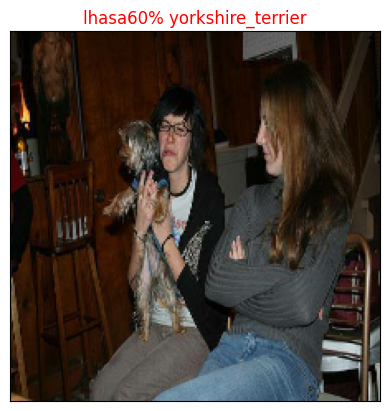

In [ ]:
plot_prediction(predictions, valid_labels, valid_images, n=10)

Definiše se funkcija *plot_prediction_configuration* koja se koristi za prikazivanje konfiguracije predviđanja tačnog rezultata vrste psa na osnovu slike prikazano grafički. Ukoliko je stvarna oznaka (label) prisutna među prvih 10 oznaka, boja stubića koji predstavlja tu oznaku će biti zelena.

In [ ]:
def plot_prediction_configuration(prediction_prob, labels, n=1):
  pred_prob, label = prediction_prob[n], labels[n]
  pred_label = get_prediction_label(pred_prob)
  top_10_prediction_indx = pred_prob.argsort()[-10:][::-1]
  top_10_prediction_values = pred_prob[top_10_prediction_indx]
  top_10_prediction_labels = unique_breeds[top_10_prediction_indx]

  top_plot = plt.bar(np.arange(len(top_10_prediction_labels)),
                     top_10_prediction_values,
                     color='grey')
  plt.xticks(np.arange(len(top_10_prediction_labels)),
              labels = top_10_prediction_labels,
              rotation='vertical')
  if np.isin(label, top_10_prediction_labels):
    top_plot[np.argmax(top_10_prediction_labels==label)].set_color("green")

Prikaz konfiguracije predviđanja prikazuje histogram sa 10 najverovatnijih oznaka i odgovarajućim verovatnoćama predviđanja.

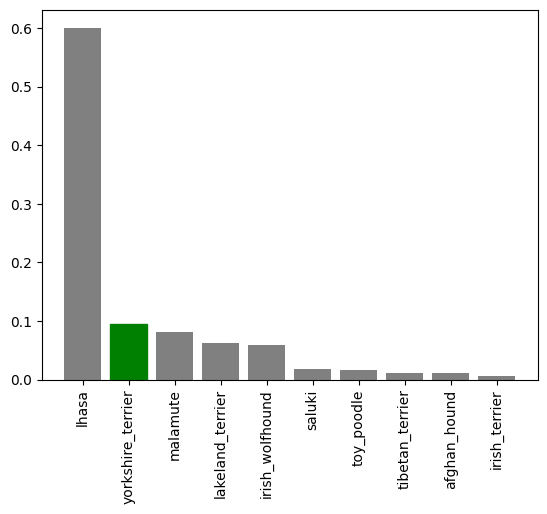

In [ ]:
plot_prediction_configuration(predictions, valid_labels, n=10)

Čuvanje istreniranog modela u u Google Colab okruženju.

In [ ]:
model.save('/content/datasetdogclass/model.h5')

Učitavanje prethodno sačuvanog modela kako bi se nastavilo sa korišćenjem modela bez potrebe za ponovnim treniranjem.

In [ ]:
savedmodel = tf.keras.models.load_model('/content/datasetdogclass/model.h5',
                                        custom_objects={"KerasLayer":hub.KerasLayer})
savedmodel.summary()
model = savedmodel

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_1 (KerasLayer)  (None, 1001)              5432713   
                                                                 
 dense_1 (Dense)             (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


Prikazivanje rezultata predviđanja i konfiguracija predviđanja za više slika iz validacionog skupa podataka, što omogućava vizuelnu evaluaciju performansi modela na različitim slikama.

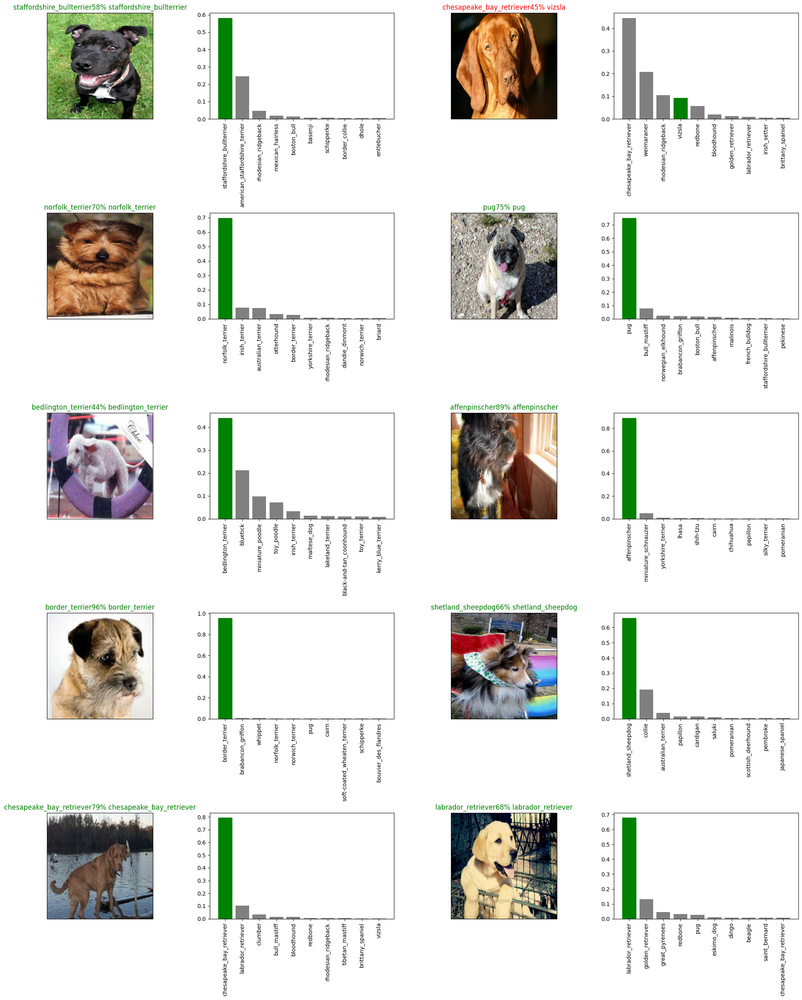

In [ ]:
multiple = 50
row_number = 5
col_number = 2
image_number = row_number*col_number
plt.figure(figsize=(10*col_number, 5*row_number))
for i in range(image_number):
  plt.subplot(row_number, 2*col_number, 2*i+1)
  plot_prediction(predictions, valid_labels, valid_images, i+multiple)
  plt.subplot(row_number, 2*col_number, 2*i+2)
  plot_prediction_configuration(predictions, valid_labels, i+multiple)
plt.tight_layout(h_pad=1.0)
plt.show()

Kreira se celokupni skup podataka u obliku batch-eva za sve slike i oznake iz skupa podataka.

In [ ]:
full_data = create_batches(X, y)

Kreira se novi model koji je spreman za treniranje ili evaluaciju na celokupnom skupu podataka.

In [ ]:
full_model = create_model()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


Definišu se povratni pozivi za praćenje performansi modela tokom treniranja i za rano zaustavljanje obučavanja na osnovu tačnosti modela.

In [ ]:
full_model_tensorboard = tensorboard_callback()
full_model_earlystop = tf.keras.callbacks.EarlyStopping(monitor="accuracy", patience=3)

Ponovno treniranje modela na osnovu svih podataka.

In [ ]:
full_model.fit(full_data, epochs=Num_epochs, callbacks=[full_model_tensorboard, full_model_earlystop])

Epoch 1/50
320/320 [==============================] - 365s 1s/step - loss: 1.3413 - accuracy: 0.6711
Epoch 2/50
320/320 [==============================] - 361s 1s/step - loss: 0.3993 - accuracy: 0.8811
Epoch 3/50
320/320 [==============================] - 357s 1s/step - loss: 0.2370 - accuracy: 0.9342
Epoch 4/50
320/320 [==============================] - 351s 1s/step - loss: 0.1548 - accuracy: 0.9643
Epoch 5/50
320/320 [==============================] - 351s 1s/step - loss: 0.1064 - accuracy: 0.9791
Epoch 6/50
320/320 [==============================] - 359s 1s/step - loss: 0.0755 - accuracy: 0.9884
Epoch 7/50
320/320 [==============================] - 356s 1s/step - loss: 0.0572 - accuracy: 0.9921
Epoch 8/50
320/320 [==============================] - 356s 1s/step - loss: 0.0482 - accuracy: 0.9927
Epoch 9/50
320/320 [==============================] - 353s 1s/step - loss: 0.0376 - accuracy: 0.9954
Epoch 10/50
320/320 [==============================] - 364s 1s/step - loss: 0.0314 - accura

Čuvanje istreniranih podataka.

In [ ]:
full_model.save('/content/datasetdogclass/full-model.h5')

Definiše se putanja do direktorijuma koji sadrži testne slike i kreira lista putanja do svih testnih slika, tj. testnog *filenames* niza.

In [ ]:
test_path = "/content/datasetdogclass/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]

test_filenames[:10]

['/content/datasetdogclass/test/95a57d8230990d5c51818101c1748108.jpg',
 '/content/datasetdogclass/test/b87e5e767fb6834a9eef31c01603bad6.jpg',
 '/content/datasetdogclass/test/92e1474b1351dc69071cea6b792fd499.jpg',
 '/content/datasetdogclass/test/52de55bf937d6790ae8efab675b7adef.jpg',
 '/content/datasetdogclass/test/72617dd852625db8ab948d80aa7ced19.jpg',
 '/content/datasetdogclass/test/f7d9fb4125bb38adb9887b881aabda26.jpg',
 '/content/datasetdogclass/test/a5d1f79162eb391ad82192d4d6899181.jpg',
 '/content/datasetdogclass/test/e76a58909e6e1196bdefb3105060bcbe.jpg',
 '/content/datasetdogclass/test/a8dba4a58717a26f645ba6099a897014.jpg',
 '/content/datasetdogclass/test/c16b504bbfeb045841a6f9aaba299e19.jpg']

Formira se testni skup podataka u obliku batch-eva na osnovu putanja do testnih slika.

In [ ]:
test_data = create_batches(test_filenames, test_data=True)

Dobija se povratna informacija o performansi modela na validacionom skupu podataka.

In [ ]:
full_model.evaluate(valid_data)

7/7 [==============================] - 8s 1s/step - loss: 0.0085 - accuracy: 1.0000


[0.0084562161937356, 1.0]

Predviđanja modela na validacionom skupu podataka.

In [ ]:
predictions = full_model.predict(valid_data, verbose=1)
predictions

7/7 [==============================] - 8s 1s/step


array([[3.76100985e-07, 1.34302214e-09, 7.34759098e-08, ...,
        2.12807686e-06, 1.46212304e-08, 4.22975077e-09],
       [7.19498405e-10, 1.65079843e-08, 2.69955422e-07, ...,
        3.66044328e-09, 6.94156341e-08, 3.06028675e-10],
       [2.12380192e-15, 4.25243440e-09, 8.71472547e-11, ...,
        3.50904805e-10, 2.60722433e-11, 1.43325712e-10],
       ...,
       [4.51535680e-14, 1.18838240e-12, 9.55266075e-12, ...,
        9.45247569e-14, 1.24361677e-09, 2.37560123e-12],
       [8.00885914e-07, 1.03401554e-08, 2.25907897e-08, ...,
        4.14943564e-08, 2.16613421e-06, 2.77966774e-05],
       [5.31059585e-10, 2.89443101e-12, 5.95646310e-10, ...,
        1.15741875e-06, 2.68202722e-08, 5.56629576e-10]], dtype=float32)

Vizuelni prikaz rezultata predviđanja modela za odabranu sliku iz validacionog skupa na osnovu svih podataka.

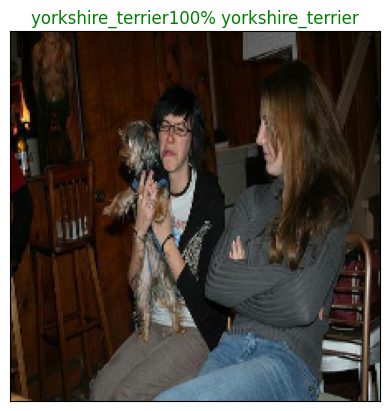

In [ ]:
plot_prediction(predictions, valid_labels, valid_images, n=10)

Prikaz konfiguracije predviđanja prikazuje histogram sa 10 najverovatnijih oznaka i odgovarajućim verovatnoćama predviđanja.

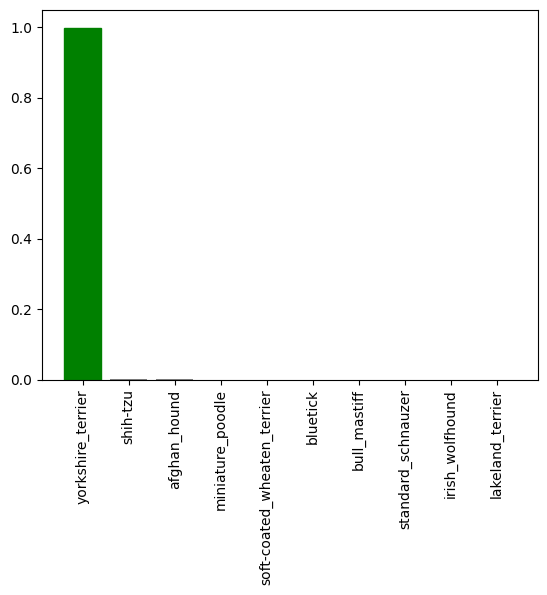

In [ ]:
plot_prediction_configuration(predictions, valid_labels, n=10)

Prikazivanje rezultata predviđanja i konfiguracija predviđanja za više slika iz validacionog skupa podataka.

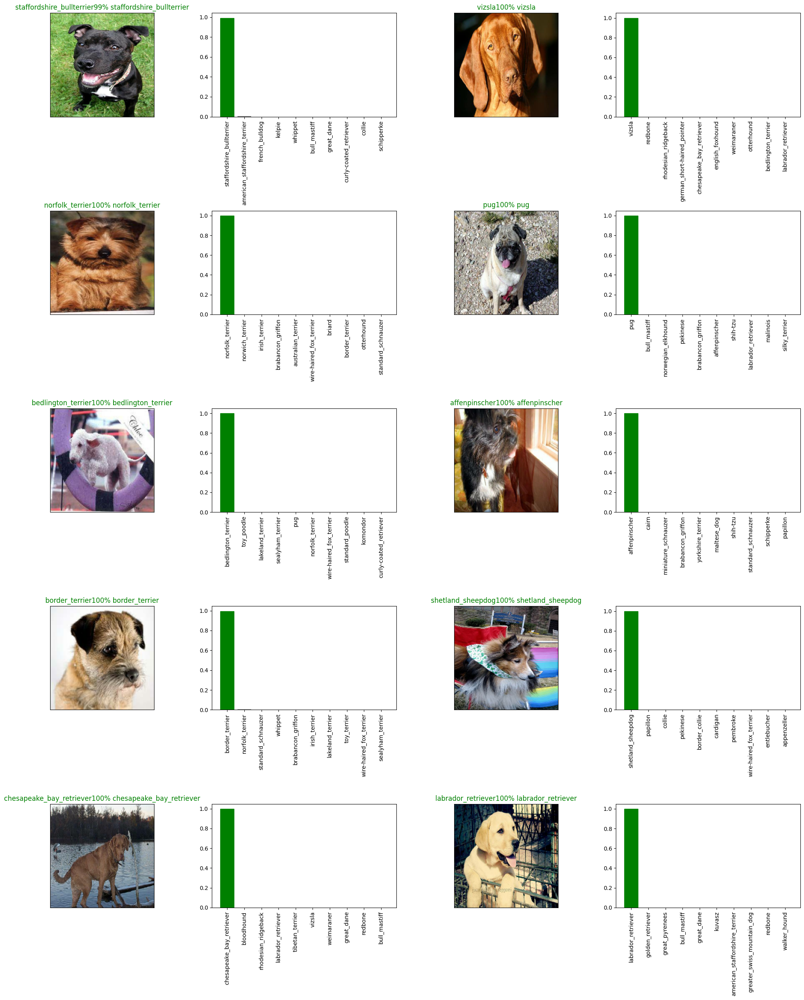

In [ ]:
multiple = 50
row_number = 5
col_number = 2
image_number = row_number*col_number
plt.figure(figsize=(10*col_number, 5*row_number))
for i in range(image_number):
  plt.subplot(row_number, 2*col_number, 2*i+1)
  plot_prediction(predictions, valid_labels, valid_images, i+multiple)
  plt.subplot(row_number, 2*col_number, 2*i+2)
  plot_prediction_configuration(predictions, valid_labels, i+multiple)
plt.tight_layout(h_pad=1.0)
plt.show()

Na kraju se uočava da su rezultati bolji nakon drugog treniranja koje je rađeno na osnovu znatno većeg broja uzoraka, jer je predviđanje rase pasa za sve slike tačno.




# **Zaključak**

Izrada ovog projekta bila je veoma zanimljiva, i pored toga mi je donela još jedno novo iskustvo u oblasti *Deep Learning*-a. Pri samoj izradi dosta sam istraživala ovu oblast. Iako smatram da su rezultati ovog projekta, odnosno tačnosti algoritma poprilično dobri, uvek postoji prostora za unapređenje i nadogradnju u cilju dostizanja još boljeg rezltata. Sama tema je bila vrlo zanimljiva i može se primeniti i u sadašnjosti.


#**Reference**
[1] TensorFlow Tutorials Available at: https://www.tensorflow.org/tutorials

[2] MobileNetV2 Available at: https://paperswithcode.com/method/mobilenetv2

[3] Datagen(2022) How Are Convolutional Neural Networks (CNNs) Used for Image Classification? Available at: https://datagen.tech/guides/image-classification/image-classification-using-cnn/

[4] Jason Brownlee(2017) A Gentle Introduction to Transfer Learning for Deep Learning. Available at: https://machinelearningmastery.com/transfer-learning-for-deep-learning/

[5] Dubravko Ćulibrk(2012) Otkrivanje znanja iz podataka: Odabrana poglavlja.Fort Lauderdale, USA: CreateSpace Independent Publishing Platform.
